In [1]:
import os
import shutil
import random
import pickle
from pathlib import Path
from collections import Counter
from __future__ import annotations

import pandas as pd
import plotly.graph_objects as go

In [13]:
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    from google.colab import drive
    from google.colab import userdata
    import secrets

    drive.mount('/content/drive', force_remount=True)
    # copy over env, requirem ents and any other required assets from local copy of repo
    if not os.path.exists('./.env'):
        shutil.copy('/content/drive/MyDrive/CCOM_MS/Aegir-Eiders-Lightning-Lance/.env', './.env')
    # emulate ice-mELT repo dir structure
    os.makedirs("db/pv_domain", exist_ok=True)
    os.makedirs("figures", exist_ok=True)
    os.makedirs("slides", exist_ok=True)
    shutil.copy('/content/drive/MyDrive/CCOM_MS/ice-mELT_ducklake/slides/pr_pv_capacity_plot.py', 'slides/')
    shutil.copy('/content/drive/MyDrive/CCOM_MS/ice-mELT_ducklake/db/pv_domain/LUMA-Interconnections-Prog-Report-Jun-2025.xlsx', 'db/pv_domain/')
    DB_PATH = Path("db/pv_domain/LUMA-Interconnections-Prog-Report-Jun-2025.xlsx")
    DIAGRAM_PATH = Path("figures/pv-s3_arch_diagram.mmd")
    !wget "https://gist.githubusercontent.com/avega17/2cae5ae23ba66b8e2f5482ee4bb78c56/raw/309e82483af8a0a4ccb67c71d160666d10647d27/pv-s3_arch_diagram.mmd" -O "figures/pv-s3_arch_diagram.mmd"
    
else:
    # update db path for local use
    DB_PATH = Path("../db/pv_domain/LUMA-Interconnections-Prog-Report-Jun-2025.xlsx")
    DIAGRAM_PATH = Path("../figures/pv-s3_arch_diagram.mmd")

In [6]:
# import util for pv capacity plot
import sys
from pathlib import Path

# Add parent directory to path to import from slides/
notebook_dir = Path.cwd()
parent_dir = notebook_dir.parent
if str(parent_dir) not in sys.path:
    sys.path.insert(0, str(parent_dir))

from slides.pr_pv_capacity_plot import load_monthly_capacity_records, build_capacity_figure

requirements = [
    'duckdb==1.4.1',
    'ibis-framework[duckdb,geospatial]',
    'geopandas',
    's3fs',
    'mermaid-python',
    'plotly'
]

!uv pip install {' '.join(requirements)}

Using Python 3.11.14 environment at: /Volumes/Expanse/repos/ice-mELT_ducklake/.venv
Audited 6 packages in 53ms


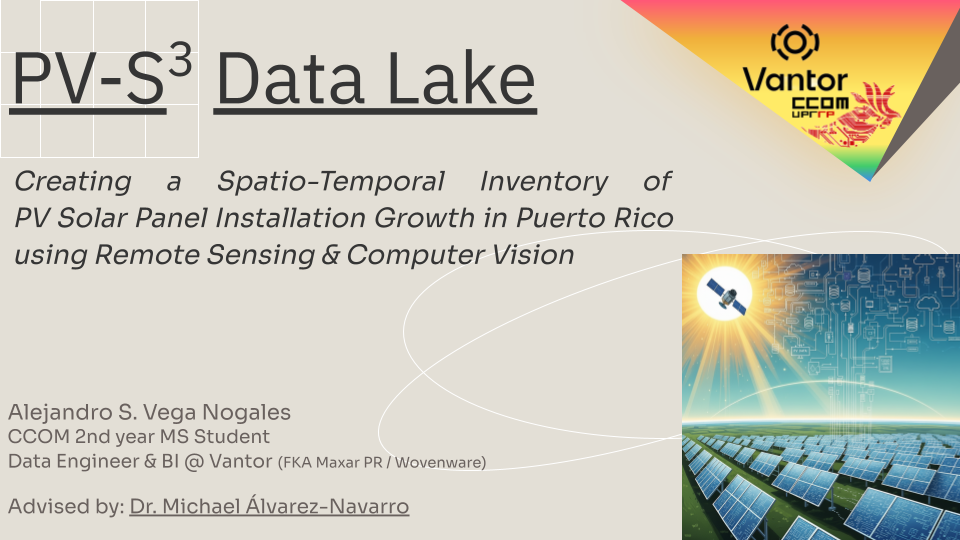

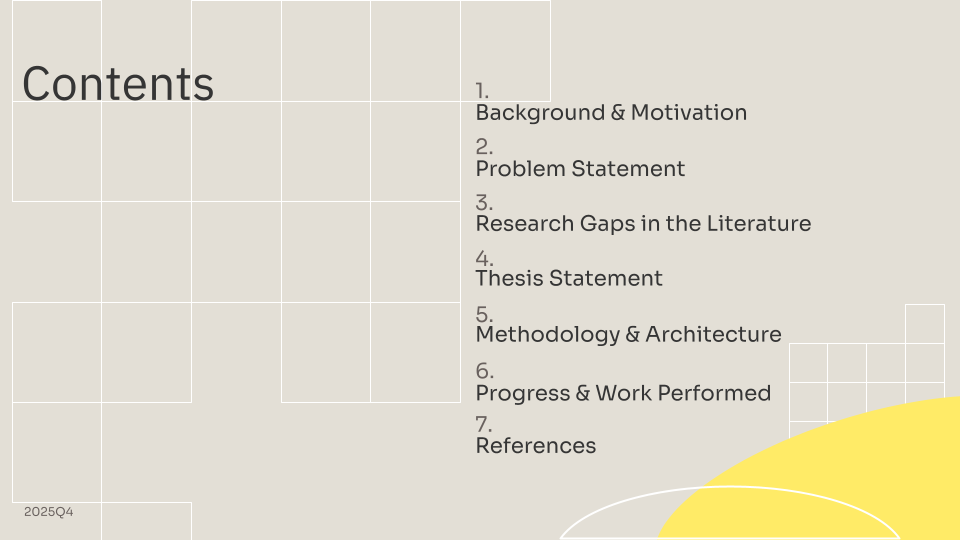

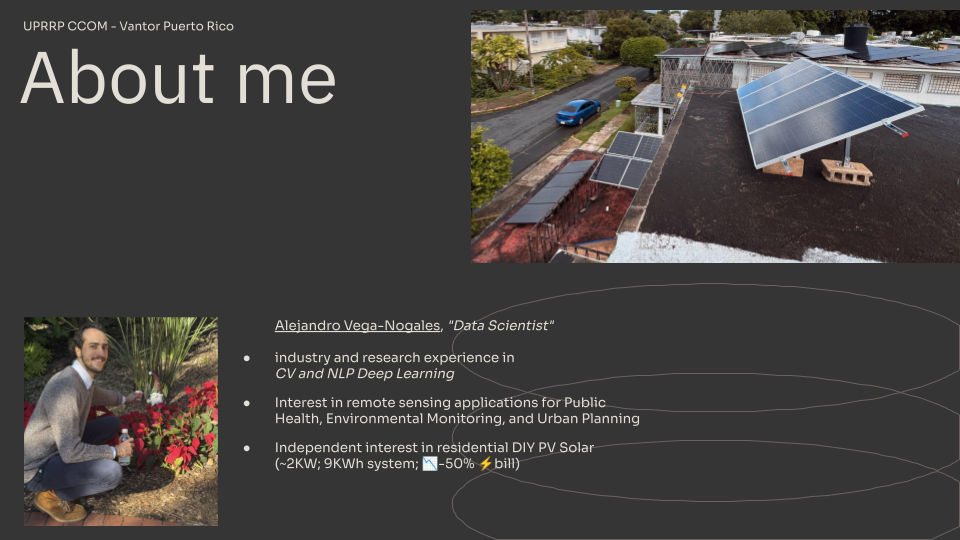

## Vantor operates a constellation of very-high-resolution (VHR) Commercial Earth Observation (EO) satellites


- 10 sub-meter spatial resolution Electro-optical satellites; 3.6M km2 collected daily at 30cm resolution
- Relevant Data: Open Data Program; cloud-free 30cm global mosaic basemaps

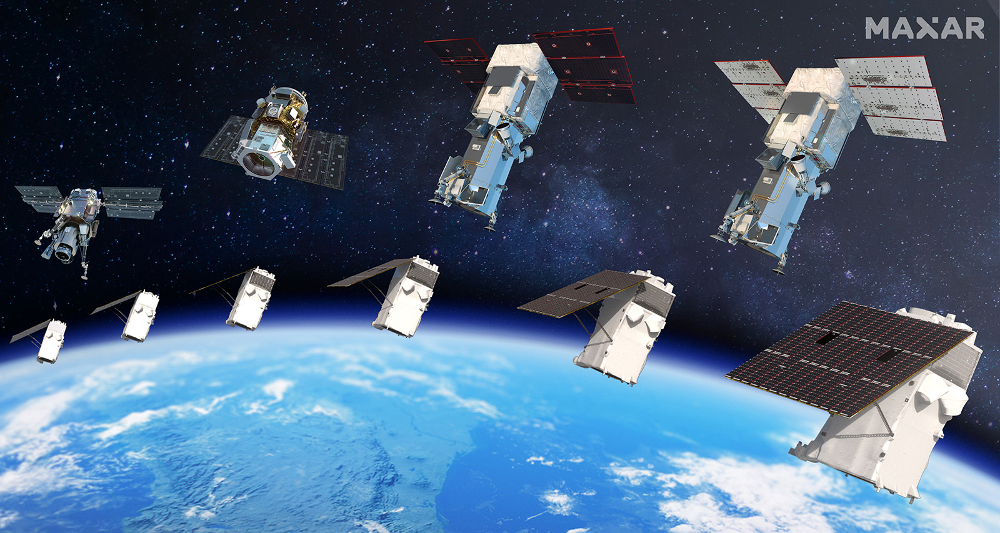

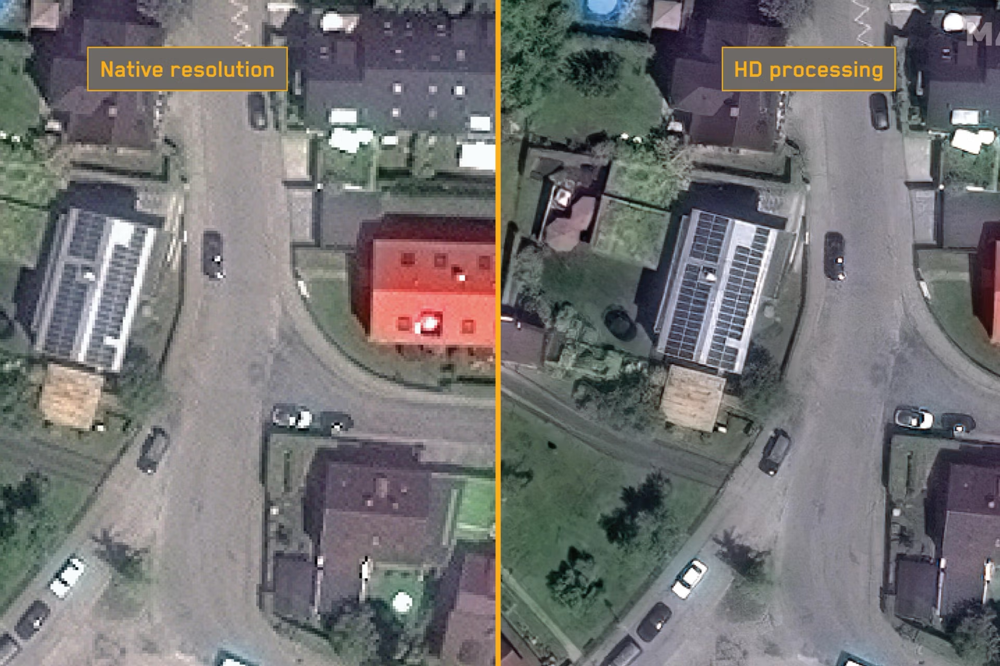

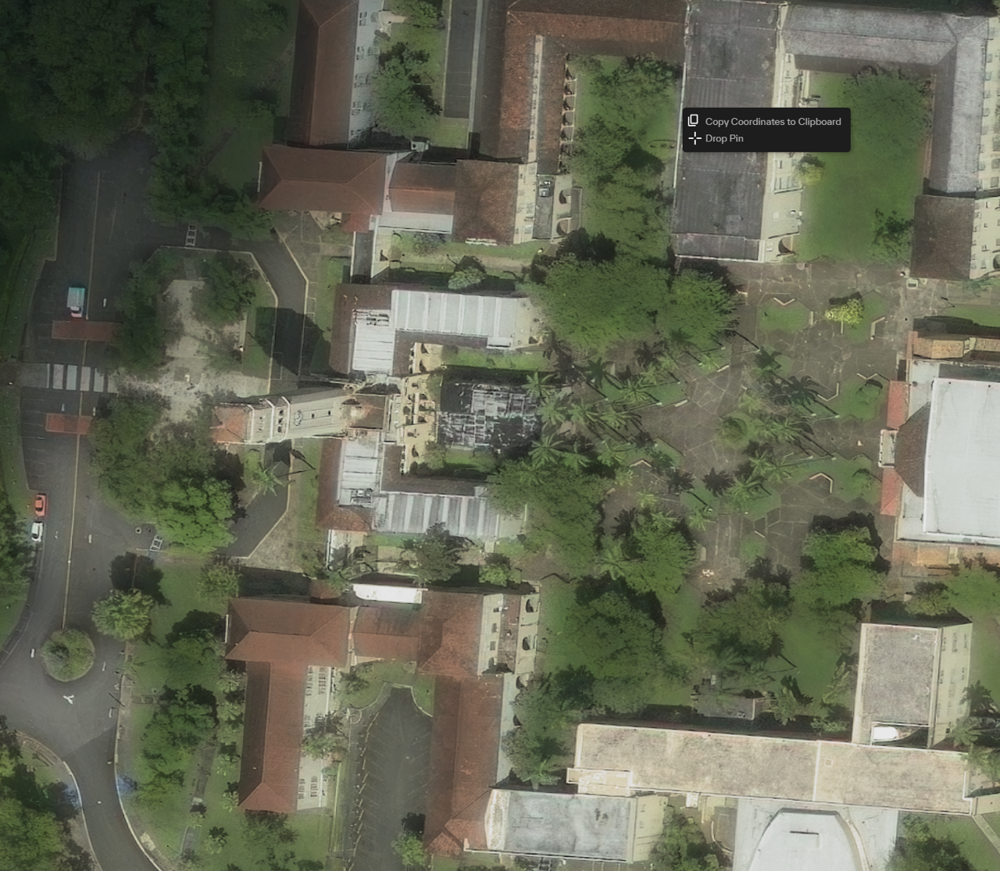

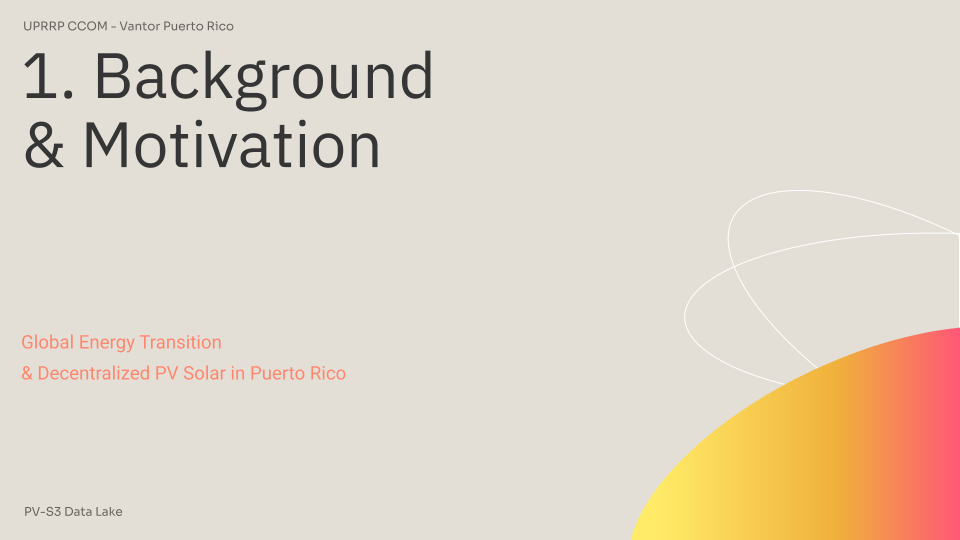

## Global Energy Transition & the Dominance of PV Solar

- The significant increase in renewable energy across the global energy landscape has undergone a rapid shift from being primariy driven by moral arguments and environmental policy to being motivated by national economic and energy sovereignty goals [cite]

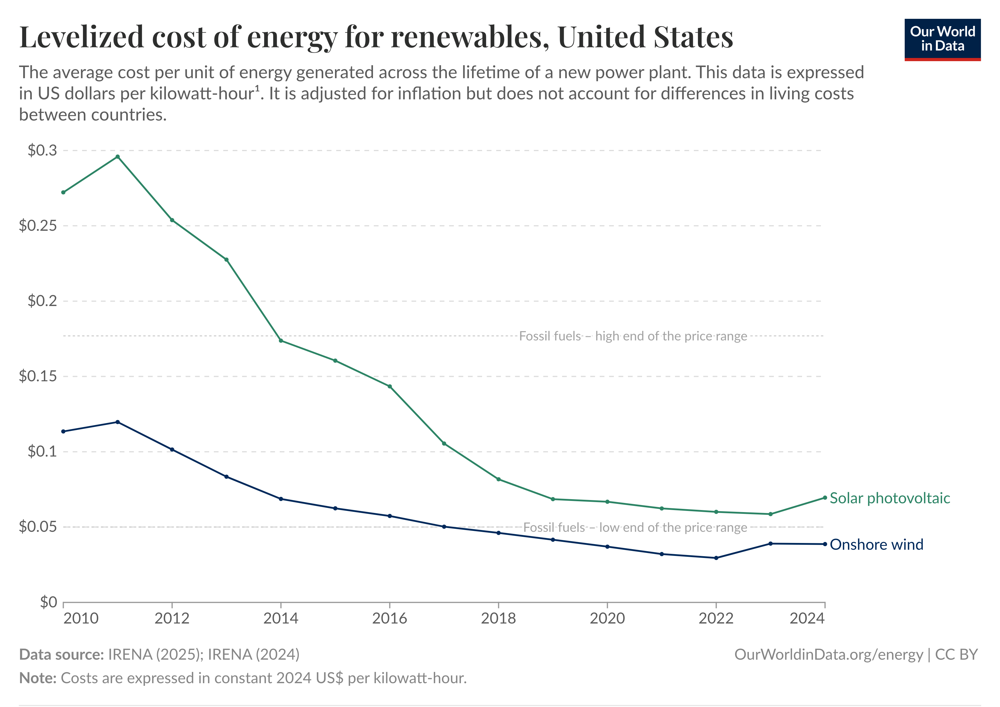

## Global Energy Transition & the Dominance of PV Solar

- Monitoring renewable energy expansion is still crucial for meeting national climate commitments and tracking progress towards carbon neutrality goals (Source: Clark & Pacifici)

<!-- source for figure is NREL blog post: https://www.nrel.gov/news/detail/program/2024/stellar-year-for-the-solar-market-at-home-and-abroad -->

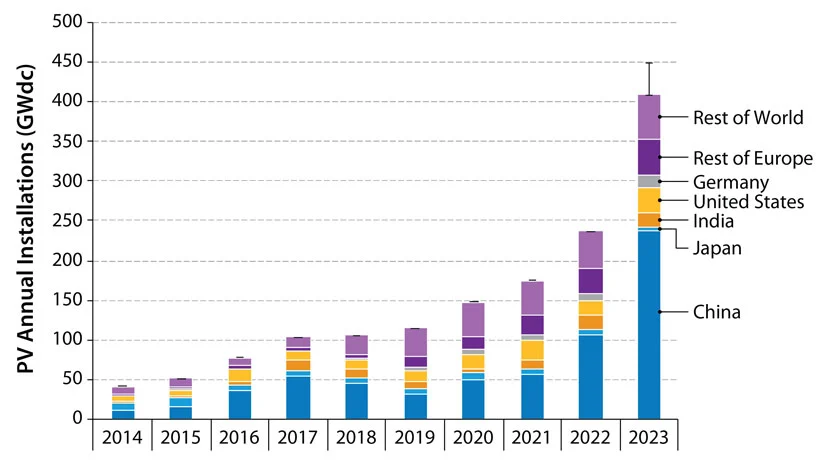


<!-- figures from IRENA report here: https://www.irena.org/-/media/Files/IRENA/Agency/Publication/2024/Sep/IRENA_Renewable_power_generation_costs_in_2023.pdf -->

## Global Energy "Transition" & the Dominance of PV Solar

- Installed Renewable energy capacity grew by **80% in last 5 years** with **Solar PV and wind accounting for ~95% of that expansion**, making accurate inventories essential for energy system modeling and policy (Source: Robinson et al., 2025)

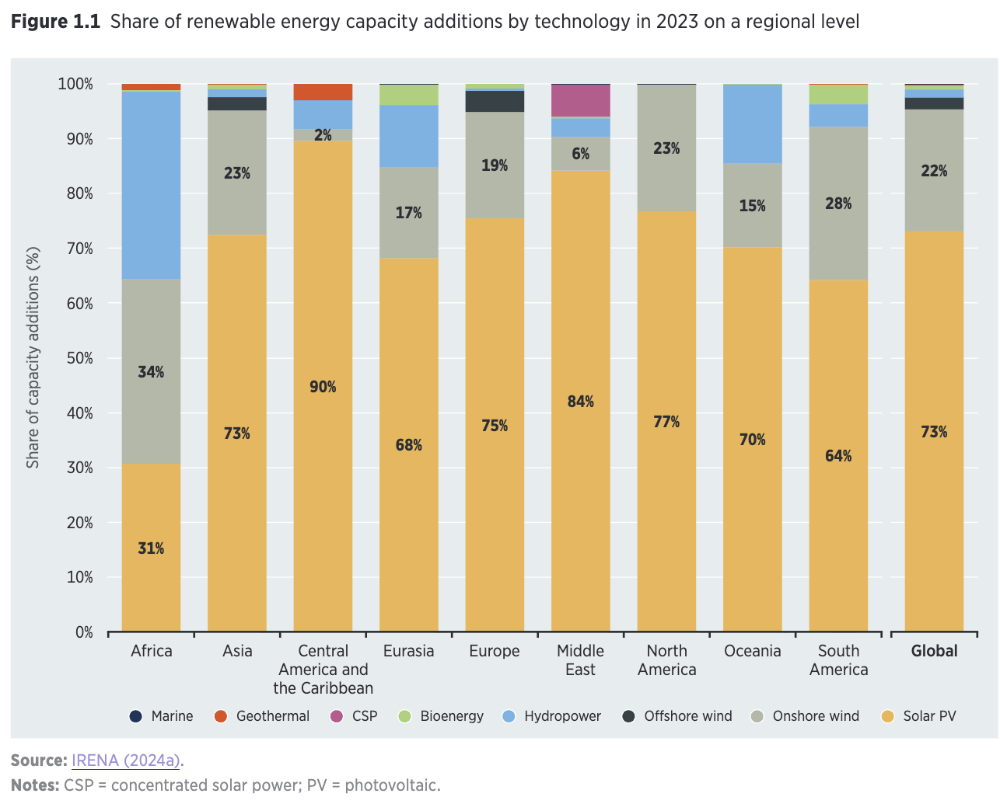

## Puerto Rico: Fragile Energy Grid & the Rise of Decentralized PV Solar

- After Hurricane María, distributed rooftop solar has become the primary driver of renewable energy growth in 🇵🇷

- Grid-connected capacity saw a ~10x increase 2017-2024 from residents and businesses seeking resiliency against an unreliable energy grid.

<!-- source IEEFA: https://ieefa.org/resources/rooftop-solar-puerto-rico-reaches-10-grid-reliability-continues-wane -->
- By 06/25, >10% of *electricity consumption* in 🇵🇷 now comes from ~1.2GW of net-metered residential and commercial rooftop solar.

(Source: IEEFA, Solar at a Crossroads report, 2024; LUMA Interconnect Progress Report June-2025)

In [10]:
capacity_data = load_monthly_capacity_records(DB_PATH)
capacity_figure = build_capacity_figure(capacity_data)
capacity_figure.show()

## PV ☀️ in 🇵🇷: Not so Sunny for Equity and Land Use
<!-- SREP = suelo rustico especialmente protegido -->

- Ecological Land-Use Conflicts for utility-scale installations (Source: RUM, Sotomayor et al, 2023)
    - 78% of Acreage of studied ** projects were located in SREP**

- Economic Disparity in residential installations (Source: IEEFA, 2024)
    - the **cost of the avg. PV system** installed in 🇵🇷 is ~$28.5K; 2022 median household income was barely $24K

    - by 2022, **>71% of solar systems** had been installed by **households earning >80% of the area median income** while **only 0.1% of systems** were installed by **households earning < 30% of the median income**
- Highlights need to map installations alongside their socio-geographical context and climate risks

## The Feedback loop between Decentralized Solar and Unstable Energy Grids

- increasing complexity and variability of grid-integrated PV creates significant challenges for grid operators that must balance supply and demand (Source: PR100 Study, 2024)
- near-term generation forecasts based on accurate and granular installation inventories can aid in managing this balance (Source: Singh Bansal, 2020-2022)


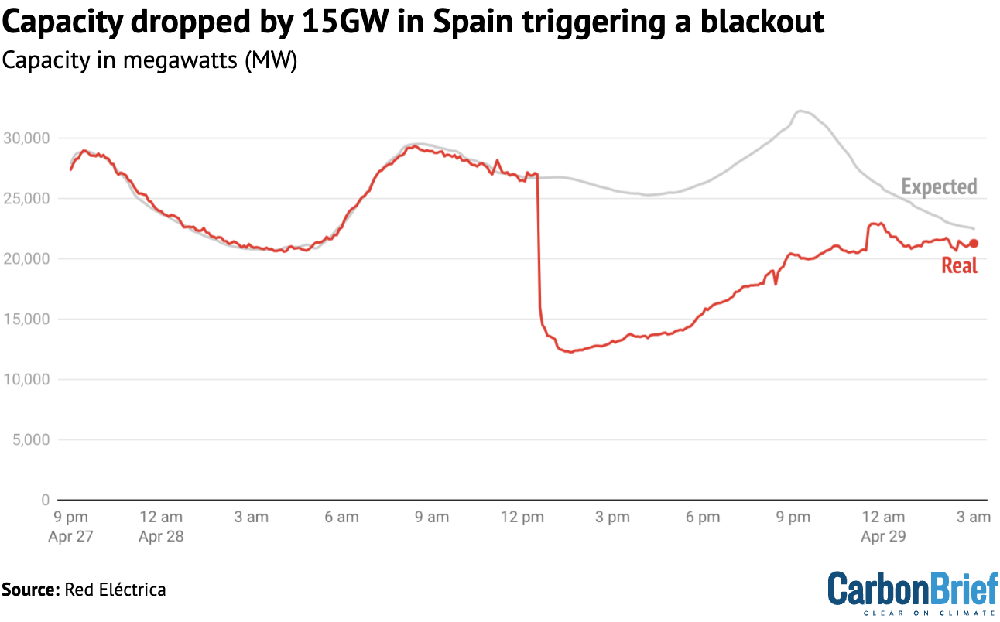





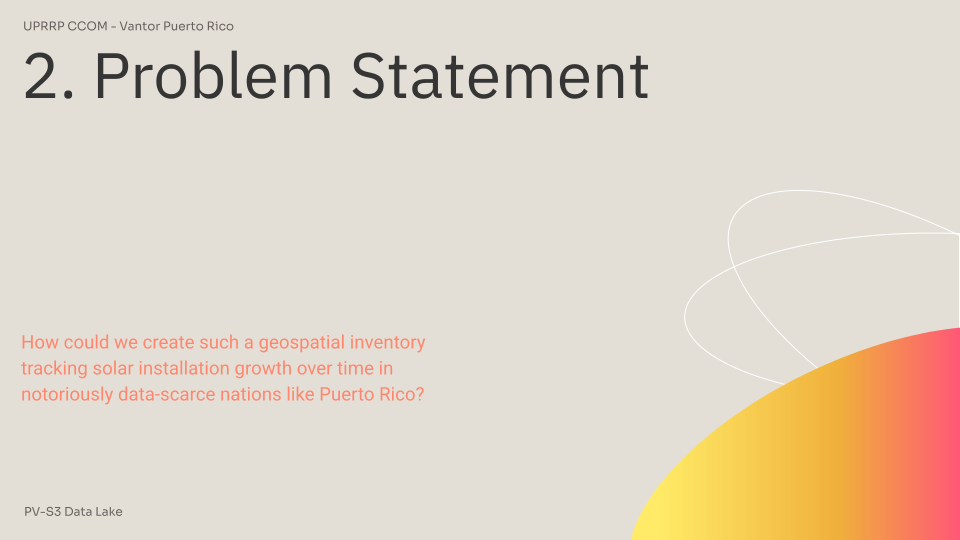

### 1. The Domain Gap: What We Need
> Grid operators and planners in Puerto Rico need granular, up-to-date inventories of distributed rooftop solar. Existing global datasets are too coarse (focusing on utility-scale) and fail to capture these critical, smaller assets.

[insert relevant visual]

### 2. The Opportunity: The "Data Deluge" and rise of CV for EO

> We are in a "golden age" of both Remotely Sensed data and Computer Vision (CV) models trained on EO data. Within our grasp, we have petabytes of archives and terabytes of daily, high-resolution imagery from public (ESA, NASA) and commercial (Maxar, Planet) constellations. Over the past decade, such EO imagery collections have enabled a variety of segmentation models proven to be reasonably effective at mapping solar panel installations and estimating generation capacity.

> On paper, we have all the ingredients to solve the "Domain Gap".

[maybe relevant visual or simple diagram]

### 3. The Real Bottleneck: The "Scalability and Accessibility Barrier"

<!-- The problem has shifted from "can it be done?" to **"can it be done scalably, robustly, and affordably?"**  -->

> This "data deluge" and the associated complexity of scaling CV training reveal three concrete barriers that form a **de facto paywall** around "free and open" EO data and analysis:

> - **Massive Data Volume**: Raw EO data is astronomically large and is not "analysis-ready."
<!-- It requires complex, domain-specific pre-processing (e.g., filtering bands, reprojecting coords) just to be usable. -->
> - **Intensive Processing Complexity:** Large-scale processing workflows for EO rely on "traditional "Big Data" approaches like Spark and horizontal-scaling that demand complex multi-node cluster setup, massive cloud bills, and specialized engineering support **just to begin analyzing data**

> - **Prohibitive Cost & Complexity:** significant cost and complexity barriers, effectively locks out local stakeholders, agencies, and smaller research labs.

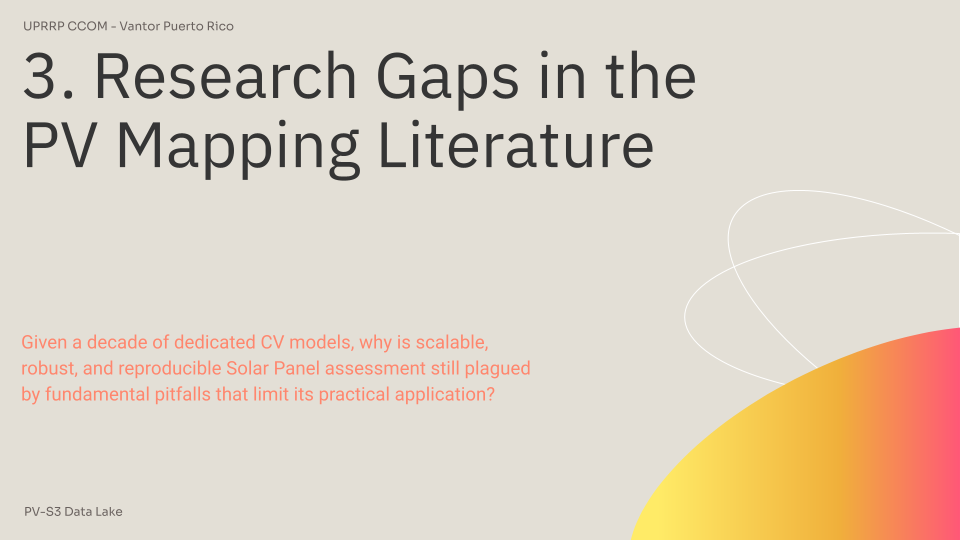

## Gap 1: Dataset Coverage & Resolution

- Global surveys are limited to large-scale "solar farms" and mostly rely on medium-resolution sensors (~10m/pixel), missing smaller distributed systems.

- On the other hand, high-resolution studies using aerial imagery are usually limited to local, city or regional scale surveys.

- There is no single, comprehensive national-scale or larger dataset of both utility-scale and distributed rooftop PV installations based on VHR datasets


## Gap 2: Applied Computer Vision methods

<!-- Many recent academic publications rely on established but older segmentation models.  -->

- A systematic performance comparison against State-of-the-Art (SOTA) architectures (Vision Transformers, Foundation Models) is lacking in the literature

- most studies neglect to enhance raw imagery with valuable spectral or spatio-temporal features.

- reviews point out the lack of post-processing generated segmentations using classic CV techniques to improve segmentations and reduce false positives.

## Gap 3: Evaluation Pitfalls

A review of current approaches has identified important challenges in accurately evaluating and comparing the performance of automated PV assessment models:
1. highly sensitivity to distribution shift (changes in geography, sensors)
2. the quality and trustworthiness of "ground truth" data
3. the level of spatial aggregation
4. reproducibility barriers due to proprietary data.

These factors make it difficult to compare studies and often lead to frequently overly optimistic performance claims that fail to materialized when applied to out-of-distribution regions.

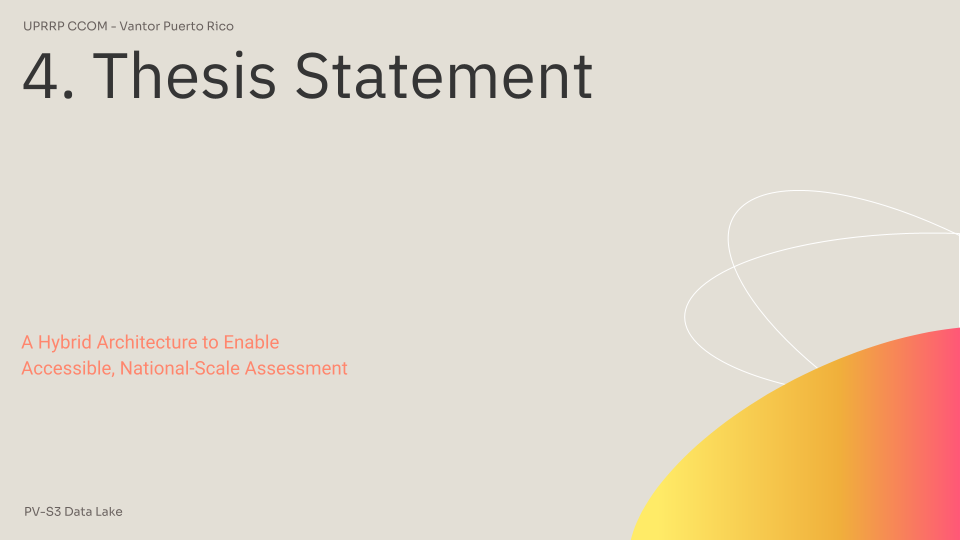

# Thesis Statement

This project proposes the design, implementation, and evaluation of “PV-S3 Geo Data Lake” — a *hybrid* **local-first, cloud-scalable** data lakehouse architecture purpose-built for large-scale, robust, and reproducible geospatial analysis. By integrating SOTA CV models with an efficient, SQL-based metadata catalog, this framework will create a comprehensive, Spatio-Temporal national-scale inventory of PV installations in Puerto Rico in the years since Hurricane María, providing critical data to support the transition to a resilient renewable energy system.

<!-- # Objectives

1. **Design, implement, and benchmark** the `PV-S³ data lakehouse`, evaluating its performance and cost-efficiency for large-scale geospatial analysis against traditional cloud-based workflows.  

2. **Finetune and benchmark** the performance of SOTA CV architectures (e.g., ViT, Foundation Models) against established baselines for robust panel segmentation, fusing VHR imagery with multispectral and spatial features.  

3. **Produce and validate** the first comprehensive, high-resolution, national-scale inventory of both utility-scale and distributed rooftop PV systems in Puerto Rico, enhanced with installation metadata.  

4. **Develop a simple and publicly accessible data portal** (web UI and API) to provide the generated inventory and analytics as an Analysis-Ready Data (ARD) product for local stakeholders. -->

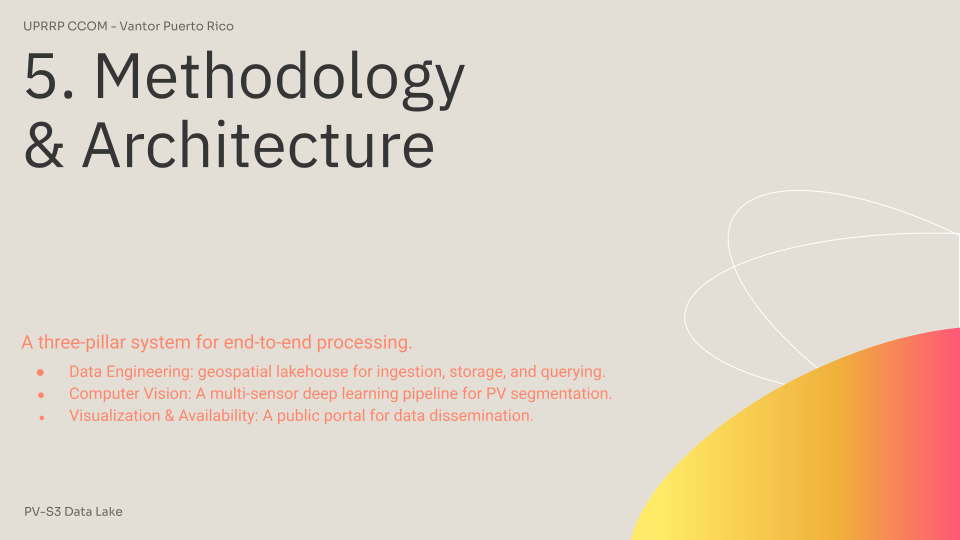

# I. Pillar 1 - Adopting Modern Data Engineering practices for PV-S³

To handle the scale of modern Earth observation data, a shift toward cloud-native formats that support efficient, partial access is underway in the industry and research community (CNG developer community, NASA, NOAA, ESA Copernicus)

## The Storage Layer: Cloud-Native Formats

- Tensors (Imagery, Climate): Zarr for chunked, parallel-read N-dimensional arrays.

- Vectors (Polygons, Metadata): GeoParquet for fast, SQL-native vector data.

- Backend: BLOB storage via S3-API (enables MinIO locally, R2/S3 in cloud).

<!-- ## The Query Layer: The "DuckLake" Pattern

- Query Engine: DuckDB. An in-process, vectorized, SQL-first OLAP engine (replaces Spark).

- Lakehouse Architecture: `DuckLake` allows for 3-way independent scaling of Storage (S3), Compute (DuckDB + Python), and Metadata (PostgreSQL).

    - How it works: We use PostgreSQL as the central, transactional metadata catalog and DuckDB as the ephemeral compute engine to query data (Parquet/Zarr) directly from object storage.

    - The "Why" (vs. Spark/Iceberg): Provides multi-table ACID transactions (via Postgres), eliminates metadata file bottlenecks, and drastically simplifies the stack.

 -->

## The Scaling Layer: Hybrid Compute

- Engine: `Dask` (Python-native, flexible parallelism).

    - The "Why": A single codebase scales from your local workstation (Dask Scheduler) to a massive cloud cluster (Coiled.io) for ingest and CV workflows.

In [14]:
from mermaid import Mermaid

with open(DIAGRAM_PATH, 'r') as f:
    arch_diagram = f.read()

Mermaid(arch_diagram)

# II. Pillar 2 - Computer Vision Pipeline

## Models: A SOTA Comparison

- **Baselines:** U-Net / DeepLabV3 / Segformer.
- **SOTA:** Vision Transformers (ViT) & CNN-Transformer hybrids.
- **Experimental:** Fine-tuned Foundation Models (e.g., Meta-AI DINOv3, NASA + IBM Prithvi-EO-2.0).

## Features: Data Fusion for Robustness

- VHR satellite imagery (raw pixels).
- Spectral: SPPI (Solar Panel) & NDVI (vegetation) indices.
- Spatial Context: Overture Maps (Building Footprints, Land Cover).
- Temporal/Other: Historical Solar Irradiance, US Census data.

## Outputs: Extracting Key Metadata

- Refine vector polygons into precise segmentation masks
- Extract installation metadata: tilt angle, azimuth, and capacity (per GM-SEUS methodology).

# Pillar 3 - Visualization & Availability

## The Data Product:

- A public, Analysis-Ready Data (ARD) georeferenced inventory of PV installations in Puerto Rico.
- Includes geometry, estimated capacity, installation date, and other metadata.

## The Public Portal:

- A web-based map visualization for exploring the dataset.
- Enables filtering by location, time, and scale.

<!-- - Served via high-performance APIs (e.g., TiTiler, pgSTAC). -->

In [12]:
from IPython.display import IFrame
# display h3 viewer
IFrame("https://h3.chotard.com", width=1080, height=540)

### The End-to-End System:

        (1) Ingest & Prepare Data.

                    ⬇️

        (2) Train Models & Analyze Data.

                    ⬇️

        (3) Deliver Dataset & Insights.

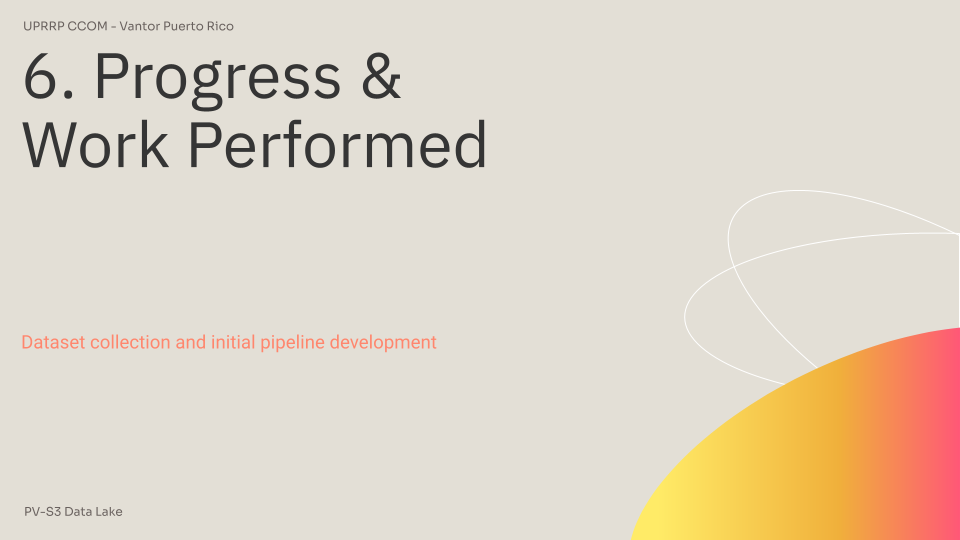

## Initial Foundational Research

- Systematic review of PV mapping literature (CV methods, DOI datasets).
- In-depth investigation of modern data architectures, culminating in the "DuckLake" design and rest of software stack

## PV-S³ Lakehouse Foundation

- Architecture: Implemented the initial DuckLake (DuckDB + R2/MinIO + Postgres) ingest and transform pipelines
- Workflow: Established the "local-first, cloud-scalable" workflow with dbt and scaling to MotherDuck (cloud DuckDB)
- Enabler: Built and configured a 12TB NVMe-based MinIO S3 server, enabling high-speed, low-cost local development and ingest for the rest of the project

## Assembled Core Data Assets
- Global PV Labels: Ingested, processed, and spatially deduplicated all major open-source PV datasets into a single, analysis-ready GeoParquet collection.
- Contextual Data: Integrated key Overture Maps layers (Building Footprints, Land Cover) into the lakehouse.
- VHR datasets: Identified several free and open options for the VHR imagery we need (HuggingFace, USDA NAIP, Satellogic Earthview, Maxar Open Data, STAC catalogs for medium resolution)

## Initial CV workflows
- Performed baseline model comparisons in a prior CV course using Maxar's solar panel dataset
- Workflows for fetching imagery and exploration of techniques to refine polygon bounds to precise segmentation masks

# 7. References

## Puerto Rico & PV Solar
1. Baggu, M. and Burton, R. (Eds.) (2024). Puerto Rico Grid Resilience and Transitions to 100% Renewable Energy Study (PR100): Final Report (**NREL**/TP-6A20-88384).
2. **IEEFA (2024). Solar at a Crossroads in Puerto Rico: Distributed Solar Drives Resilience, Utility-Scale Solar Faces Conflicts (Cited as IEEFA, Solar at a Crossroads report).**
3. Sotomayor Ramírez, D., et al., **RUM** (2023). Requisitos de área para proyectos de energía solar a escala industrial en Puerto Rico

## PV Datasets
4. Kruitwagen, L., et al., Nature (2021). A global inventory of photovoltaic solar energy generating units.
5. Clark, C. N., & Pacifici, F., Nature (2023). A solar panel dataset of very high resolution satellite imagery to support the Sustainable Development Goals.
6. **Stid, J. T., et al., Nature (2025). A harmonized dataset of ground-mounted solar energy in the US with enhanced metadata.**

## Challenges + Novel Solutions in PV CV
7. **Hu, W., et al. (2022). What you get is not always what you see—pitfalls in solar array assessment using overhead imagery.**
8. He, S., Tian, Q., & Tian, J. (2024). Developing a Universal Spectral Index for Solar Photovoltaic Panels: A Methodology for Spatial Information Extraction from Satellite Remote Sensing Imagery.

## DBMS and Data Engineering
9. **Stonebraker, M., & Pavlo, A. (2024). What Goes Around Comes Around... And Around...**
10. Abadi, D., et al. (2019/2022). The Seattle Report on Database Research.

# Acknowledgements

- Michael Alvarez
- Lillian González Albino
- Vantor for Tuition Support
- Dr. José Molinelli